In [1]:
#Import libraries
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.optim as optim
import urllib
SEED=int('01732046')
torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Google Colab:
https://colab.research.google.com/drive/1HNXu0fbYfgyRMInI9GSbhrZFYh9dQgjp?usp=sharing

In [2]:
#Import CIFAR10 dataset
transform_ = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_)
test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_)
#Data loading function
def data_loader(batch_size,train_dataset,test_dataset):
    train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=4,pin_memory=True)
    test_loader  = torch.utils.data.DataLoader(dataset=test_dataset,  batch_size=4096,       shuffle=False,num_workers=4,pin_memory=True)
    train_test   = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=4096,       shuffle=False,num_workers=4,pin_memory=True)
    return train_loader,test_loader, train_test

Files already downloaded and verified
Files already downloaded and verified


In [3]:
def train_epoch(trainloader,model,optimizer,criterion,Print=False):
    model.train()
    for i, (feature,labels) in enumerate(trainloader):
        optimizer.zero_grad()
        output=model(feature)
        loss=criterion(output,labels)
        loss.backward()
        optimizer.step()
def test_epoch(testloader,model,criterion):
    model.eval()
    test_loss=0
    correct=0
    with torch.no_grad():
        for i, (feature,labels) in enumerate(testloader):
            output=model(feature)
            test_loss+=criterion(output,labels)
            pred=output.argmax(dim=1,keepdim=True)
            correct+=pred.eq(labels.view_as(pred)).sum()
        test_loss/=len(testloader.dataset)
        accuracy=correct/len(testloader.dataset)
    return test_loss,accuracy
def train_model(lr,n_epochs,model,trainloader,testloader,train_test):
    criterion=nn.CrossEntropyLoss(reduction='sum')
    optimizer=optim.Adam(model.parameters(),lr=lr)
    train_loss=[]
    test_loss=[]
    test_accuracy=[]
    train_accuracy=[]
    for epoch in range(n_epochs):
        train_epoch(trainloader,model,optimizer,criterion)
        test_loss_,test_accuracy_=test_epoch(testloader,model,criterion)
        train_loss_,train_accuracy_=test_epoch(train_test,model,criterion)
        test_loss.append(test_loss_)
        train_loss.append(train_loss_)
        test_accuracy.append(test_accuracy_)
        train_accuracy.append(train_accuracy_)
        if epoch==n_epochs-1:
            print(f'Final results: Epoch:{n_epochs}|Train Loss:{train_loss_:.5f}|Test Loss:{test_loss_:.5f}|Train Accuracy:{train_accuracy_:.5f}|Test Accuracy:{test_accuracy_:.5f}')
        if (epoch+1)%2==0 or epoch==0:
            print(f'Epoch:{epoch+1:03}|Train Loss:{train_loss_:.5f}|Test Loss:{test_loss_:.5f}|Train Accuracy:{train_accuracy_:.5f}|Test Accuracy:{test_accuracy_:.5f}')
    return train_loss,test_loss,train_accuracy,test_accuracy

In [4]:
#Define the model with 2 fully connected layers and 2 convolutional layers with max pooling
class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
    def forward(self,x):
        x=self.pool(self.activation(self.conv1(x)))
        x=self.pool(self.activation(self.conv2(x)))
        x=nn.Flatten()(x)
        x=self.activation(self.fc1(x))
        x=self.activation(self.fc2(x))
        x=self.fc3(x)
        return x

In [5]:
batch_size=50
learning_rate=0.001
epochs=15
train_loader,test_loader,train_test=data_loader(batch_size,train_dataset,test_dataset)
model=CNN()
train_loss_vanilla,test_loss_vanilla,train_accuracy_vanilla,test_accuracy_vanilla=train_model(learning_rate,epochs,model,train_loader,test_loader,train_test)
generalization_vanilla=np.abs(np.array(train_loss_vanilla)-np.array(test_loss_vanilla))

Epoch:001|Train Loss:1.41377|Test Loss:1.41911|Train Accuracy:0.48222|Test Accuracy:0.48070
Epoch:002|Train Loss:1.22478|Test Loss:1.25137|Train Accuracy:0.56026|Test Accuracy:0.55100
Epoch:004|Train Loss:1.06735|Test Loss:1.14353|Train Accuracy:0.61982|Test Accuracy:0.59190
Epoch:006|Train Loss:0.92258|Test Loss:1.05893|Train Accuracy:0.67214|Test Accuracy:0.62370
Epoch:008|Train Loss:0.88609|Test Loss:1.06735|Train Accuracy:0.68506|Test Accuracy:0.62590
Epoch:010|Train Loss:0.86632|Test Loss:1.11053|Train Accuracy:0.69602|Test Accuracy:0.62290
Epoch:012|Train Loss:0.71291|Test Loss:1.03234|Train Accuracy:0.74896|Test Accuracy:0.64190
Epoch:014|Train Loss:0.68953|Test Loss:1.08415|Train Accuracy:0.75434|Test Accuracy:0.63430
Final results: Epoch:15|Train Loss:0.65593|Test Loss:1.06576|Train Accuracy:0.76848|Test Accuracy:0.64220


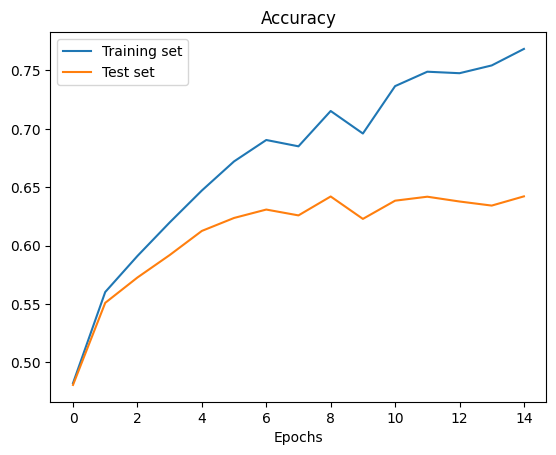

In [6]:
plt.plot(train_accuracy_vanilla,label='Training set')
plt.plot(test_accuracy_vanilla,label='Test set')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.legend()
plt.show()

## Dropout 
Dropout is a regularization technique used in neural networks to prevent overfitting. Overfitting occurs when a model is too complex and starts to learn the noise in the training data instead of the underlying pattern. Dropout is a method for reducing the complexity of the network by randomly dropping out (i.e., setting to zero) some of the neurons during training.

During training, each neuron in the network is either present with probability p or dropped out with probability 1-p. This means that the output of each neuron is multiplied by a random binary mask with probability p. This has the effect of reducing the co-adaptation of neurons and encourages the network to learn more robust features.

At test time, the dropout is turned off, and the network uses all of its neurons for prediction. This means that the network learns to make predictions in the presence of noise and uncertainty, making it more likely to generalize to new data.

Overall, dropout is an effective and computationally efficient way to prevent overfitting in neural networks.

In [7]:
class CNN_dropout(nn.Module):
    def __init__(self,p):
        super(CNN_dropout,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(p)
    def forward(self,x):
        x=self.pool(self.activation(self.conv1(x)))
        x=self.pool(self.activation(self.conv2(x)))
        x=nn.Flatten()(x)
        x=self.activation(self.dropout(self.fc1(x)))
        x=self.activation(self.dropout(self.fc2(x)))
        x=self.fc3(x)
        return x

In [8]:
#Parameters
learning_rate=0.001
batch_size=50
epochs=15
train_loader,test_loader,train_test=data_loader(batch_size,train_dataset,test_dataset)
#Testing the effect of different probabilities of dropout
Probabilities=[0.1,0.2,0.3,0.4,0.6,0.8]
train_loss_dict={}
test_loss_dict={}
train_accuracy_dict={}
test_accuracy_dict={}
for p in Probabilities:
    model=CNN_dropout(p)
    print(f'p={p}')
    train_loss,test_loss,train_accuracy,test_accuracy=train_model(learning_rate,epochs,model,train_loader,test_loader,train_test)
    train_loss_dict[p]=train_loss
    test_loss_dict[p]=test_loss
    train_accuracy_dict[p]=train_accuracy
    test_accuracy_dict[p]=test_accuracy

p=0.1
Epoch:001|Train Loss:1.39429|Test Loss:1.41186|Train Accuracy:0.48788|Test Accuracy:0.48310
Epoch:002|Train Loss:1.23609|Test Loss:1.27642|Train Accuracy:0.55700|Test Accuracy:0.54260
Epoch:004|Train Loss:1.05733|Test Loss:1.14175|Train Accuracy:0.62172|Test Accuracy:0.58890
Epoch:006|Train Loss:0.94964|Test Loss:1.07705|Train Accuracy:0.66782|Test Accuracy:0.62120
Epoch:008|Train Loss:0.89588|Test Loss:1.06451|Train Accuracy:0.68542|Test Accuracy:0.62460
Epoch:010|Train Loss:0.82312|Test Loss:1.05374|Train Accuracy:0.70796|Test Accuracy:0.62980
Epoch:012|Train Loss:0.77796|Test Loss:1.04339|Train Accuracy:0.72726|Test Accuracy:0.63890
Epoch:014|Train Loss:0.73763|Test Loss:1.05915|Train Accuracy:0.73970|Test Accuracy:0.63610
Final results: Epoch:15|Train Loss:0.72138|Test Loss:1.05874|Train Accuracy:0.74638|Test Accuracy:0.63400
p=0.2
Epoch:001|Train Loss:1.43369|Test Loss:1.44998|Train Accuracy:0.48158|Test Accuracy:0.47500
Epoch:002|Train Loss:1.28513|Test Loss:1.32295|Train A

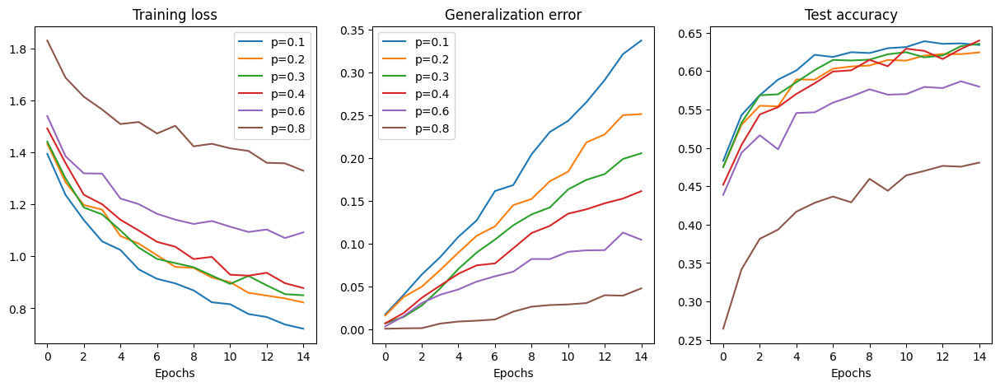

In [9]:
#Plot of the generalization error
fig,ax=plt.subplots(1,3,figsize=(15,5))
for p in Probabilities:
    ax[0].plot(train_loss_dict[p],label=f'p={p}')
    ax[1].plot(abs(np.array(train_loss_dict[p])-np.array(test_loss_dict[p])),label=f'p={p}')
    ax[2].plot(test_accuracy_dict[p],label=f'p={p}')
ax[0].set_title('Training loss')
ax[1].set_title('Generalization error')
ax[2].set_title('Test accuracy')
ax[0].set_xlabel('Epochs')
ax[1].set_xlabel('Epochs')
ax[2].set_xlabel('Epochs')
ax[0].legend()
ax[1].legend()
plt.show()


Based on the plot, we can see that the model with the largest dropout rate has the lowest generalization error, but it also has poor performance in terms of training loss and accuracy. This can be attributed to the fact that a large proportion of neurons (80%) are dropped out during training, making it more challenging to optimize the model parameters. As a result, the model is not able to learn as effectively, leading to poor training loss and accuracy.

On the other hand, the model with a dropout rate of 0.3 achieves a good balance between generalization error and performance. This means that the model is able to generalize well while also performing well on the training data. Therefore, we will use a dropout probability of 0.3 for the remainder of the notebook.

In [10]:
#Task 2 Dropout
class CNN_dropout1(nn.Module):
    def __init__(self,p):
        super(CNN_dropout1,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(p, inplace=True)
    def forward(self,x):
        x=self.pool(self.activation(self.conv1(x)))
        x=self.pool(self.activation(self.conv2(x)))
        x=nn.Flatten()(x)
        x=self.activation(self.dropout(self.fc1(x)))
        x=self.activation(self.fc2(x))
        x=self.fc3(x)
        return x
class CNN_dropout2(nn.Module):
    def __init__(self,p):
        super(CNN_dropout2,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(p, inplace=True)
    def forward(self,x):
        x=self.pool(self.activation(self.conv1(x)))
        x=self.pool(self.activation(self.conv2(x)))
        x=nn.Flatten()(x)
        x=self.activation(self.fc1(x))
        x=self.activation(self.dropout(self.fc2(x)))
        x=self.fc3(x)
        return x
class CNN_dropout3(nn.Module):
    def __init__(self,p):
        super(CNN_dropout3,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(p, inplace=True)
    def forward(self,x):
        x=self.pool(self.activation(self.conv1(x)))
        x=self.pool(self.activation(self.conv2(x)))
        x=nn.Flatten()(x)
        x=self.dropout(x)
        x=self.activation(self.dropout(self.fc1(x)))
        x=self.activation(self.dropout(self.fc2(x)))
        x=self.fc3(x)
        return x
class CNN_dropout4(nn.Module):
    def __init__(self,p):
        super(CNN_dropout4,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.conv2=nn.Conv2d(6,16,5)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(p, inplace=True)
    def forward(self,x):
        x=self.pool(self.activation(self.dropout(self.conv1(x))))
        x=self.pool(self.activation(self.dropout(self.conv2(x))))
        x=nn.Flatten()(x)
        x=self.activation(self.fc1(x))
        x=self.activation(self.fc2(x))
        x=self.fc3(x)
        return x

We have created 4 different neural network models to test out how the location of dropout affects the performance of the model.
\
Model 1: Dropout on the first fully connected layer
\
Model 2: Dropout on the second fully connected layer
\
Model 3: Dropout on all the fully connected layers
\
Model 4: Dropout on all the convolutional layers

In [38]:
learning_rate=0.001
batch_size=50
epochs=15
train_loader,test_loader,train_test=data_loader(batch_size,train_dataset,test_dataset)
#Dropout rate
p=0.3
#Initialize the different models
model1=CNN_dropout1(p)
model2=CNN_dropout2(p)
model3=CNN_dropout3(p)
model4=CNN_dropout4(p)
print('model1')
train_loss1,test_loss1,train_accuracy1,test_accuracy1=train_model(learning_rate,epochs,model1,train_loader,test_loader,train_test)
print('model2')
train_loss2,test_loss2,train_accuracy2,test_accuracy2=train_model(learning_rate,epochs,model2,train_loader,test_loader,train_test)
print('model3')
train_loss3,test_loss3,train_accuracy3,test_accuracy3=train_model(learning_rate,epochs,model3,train_loader,test_loader,train_test)
print('model4')
train_loss4,test_loss4,train_accuracy4,test_accuracy4=train_model(learning_rate,epochs,model4,train_loader,test_loader,train_test)

model1
Epoch:001|Train Loss:1.42897|Test Loss:1.43823|Train Accuracy:0.47840|Test Accuracy:0.47130
Epoch:002|Train Loss:1.27739|Test Loss:1.30849|Train Accuracy:0.53412|Test Accuracy:0.52340
Epoch:004|Train Loss:1.14416|Test Loss:1.22007|Train Accuracy:0.59390|Test Accuracy:0.56950
Epoch:006|Train Loss:1.08346|Test Loss:1.17580|Train Accuracy:0.61532|Test Accuracy:0.58020
Epoch:008|Train Loss:0.97225|Test Loss:1.10114|Train Accuracy:0.65362|Test Accuracy:0.60510
Epoch:010|Train Loss:0.89167|Test Loss:1.05046|Train Accuracy:0.68666|Test Accuracy:0.62850
Epoch:012|Train Loss:0.86398|Test Loss:1.05122|Train Accuracy:0.69780|Test Accuracy:0.63090
Epoch:014|Train Loss:0.84263|Test Loss:1.05005|Train Accuracy:0.70028|Test Accuracy:0.62490
Final results: Epoch:15|Train Loss:0.80505|Test Loss:1.02624|Train Accuracy:0.72192|Test Accuracy:0.63740
model2
Epoch:001|Train Loss:1.42523|Test Loss:1.44000|Train Accuracy:0.48078|Test Accuracy:0.47590
Epoch:002|Train Loss:1.33799|Test Loss:1.37583|Train

In [39]:
train_loss1=np.array(train_loss1)
train_loss2=np.array(train_loss2)
train_loss3=np.array(train_loss3)
train_loss4=np.array(train_loss4)
test_loss1=np.array(test_loss1)
test_loss2=np.array(test_loss2)
test_loss3=np.array(test_loss3)
test_loss4=np.array(test_loss4)
#Generalization error
generalization1=np.abs(train_loss1-test_loss1)
generalization2=np.abs(train_loss2-test_loss2)
generalization3=np.abs(train_loss3-test_loss3)
generalization4=np.abs(train_loss4-test_loss4)

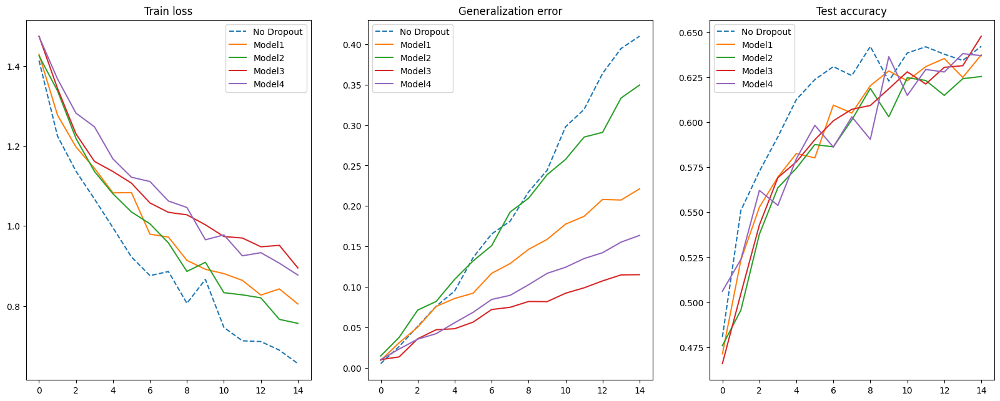

In [40]:
fig,ax=plt.subplots(1,3,figsize=(20,7.5))
ax[0].plot(train_loss_vanilla,label='No Dropout',linestyle='--')
ax[0].plot(train_loss1,label='Model1')
ax[0].plot(train_loss2,label='Model2')
ax[0].plot(train_loss3,label='Model3')
ax[0].plot(train_loss4,label='Model4')
ax[0].set_title('Train loss')
ax[0].legend()
ax[1].plot(generalization_vanilla,label='No Dropout',linestyle='--')
ax[1].plot(generalization1,label='Model1')
ax[1].plot(generalization2,label='Model2')
ax[1].plot(generalization3,label='Model3')
ax[1].plot(generalization4,label='Model4')
ax[1].set_title('Generalization error')
ax[1].legend()
ax[2].plot(test_accuracy_vanilla,label='No Dropout',linestyle='--')
ax[2].plot(test_accuracy1,label='Model1')
ax[2].plot(test_accuracy2,label='Model2')
ax[2].plot(test_accuracy3,label='Model3')
ax[2].plot(test_accuracy4,label='Model4')
ax[2].set_title('Test accuracy')
ax[2].legend()

From the plots above, we can observe that the impact of dropout depends on its location in the network. In particular, the model's performance on the training loss noticeably worse when dropout is applied, and the more dropout layers are added, the worse the performance becomes, altough there is a clear difference in loss performance, the accuracy is not affected as much, in fact the accuracy performance between the different models is very similar. It is quite suprising to see that the model with dropout applied to convolutional layers performs similarly to when dropout is applied to fully connected layers. This is because dropout behaves differently on a convolutional layer than on a fully connected layer. While dropout on a fully connected layer prevents some parameters from being trained during a particular batch, forcing the network to learn more robust features, this is not the case for dropout on a convolutional layer. As explained in this article (https://towardsdatascience.com/dropout-on-convolutional-layers-is-weird-5c6ab14f19b2), even though some of the neurons in a convolutional layer are dropped out during training, they are still somehow trained.

We can see that Model3, which has dropout applied to all fully connected layers, performs the best in terms of generalization error. This is expected because fully connected layers are more prone to overfitting. Although Model3 has a significantly worse training loss than the other models, its accuracy is still very high and comparable to the other models while keeping a low generalization error.

## Batch Normalization 
Batch normalization is a technique used in deep learning models to normalize the inputs of each layer in a mini-batch. 
\
The idea behind batch normalization is to normalize the inputs of each layer in a mini-batch by subtracting the mean and dividing by the standard deviation of the mini-batch.
The mean of the mini batch $\mu=\frac{1}{N}\sum^N x$.
\
The standard deviation of the mini-batch is $\sigma=\sqrt{\frac{1}{N}\sum^N(x-\mu)^2}$.
\
The normalized input is given by $z=\frac{x-\mu}{\sigma}$.
\
The BatchNorm function then scales and shifts the normalized inputs by two learnable parameters $\gamma$ and $\beta$: $y=\gamma z +\beta$.

In [14]:
#Task 3 Batch Normalization
class CNN_BatchNorm(nn.Module):
    def __init__(self):
        super(CNN_BatchNorm,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.bn1=nn.BatchNorm2d(6)
        self.conv2=nn.Conv2d(6,16,5)
        self.bn2=nn.BatchNorm2d(16)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
    def forward(self,x):
        x=self.pool(self.activation(self.bn1(self.conv1(x))))
        x=self.pool(self.activation(self.bn2(self.conv2(x))))
        x=nn.Flatten()(x)
        x=self.activation(self.fc1(x))
        x=self.activation(self.fc2(x))
        x=self.fc3(x)
        return x

In [15]:
learning_rate=0.001
batch_size=50
epochs=15
train_loader,test_loader,train_test=data_loader(batch_size,train_dataset,test_dataset)
model=CNN_BatchNorm()
train_loss_batchnorm,test_loss_batchnorm,train_accuracy_batchnorm,test_accuracy_batchnorm=train_model(learning_rate,epochs,model,train_loader,test_loader,train_test)

Epoch:001|Train Loss:1.36194|Test Loss:1.39586|Train Accuracy:0.51212|Test Accuracy:0.50330
Epoch:002|Train Loss:1.10905|Test Loss:1.16647|Train Accuracy:0.60422|Test Accuracy:0.58500
Epoch:004|Train Loss:0.93872|Test Loss:1.05565|Train Accuracy:0.66626|Test Accuracy:0.62700
Epoch:006|Train Loss:0.86983|Test Loss:1.03516|Train Accuracy:0.69436|Test Accuracy:0.63700
Epoch:008|Train Loss:0.77295|Test Loss:0.99377|Train Accuracy:0.72794|Test Accuracy:0.65530
Epoch:010|Train Loss:0.69358|Test Loss:0.97532|Train Accuracy:0.75684|Test Accuracy:0.66280
Epoch:012|Train Loss:0.66953|Test Loss:0.99948|Train Accuracy:0.76318|Test Accuracy:0.66290
Epoch:014|Train Loss:0.61078|Test Loss:1.00742|Train Accuracy:0.78474|Test Accuracy:0.66680
Final results: Epoch:15|Train Loss:0.60746|Test Loss:1.02486|Train Accuracy:0.78290|Test Accuracy:0.66720


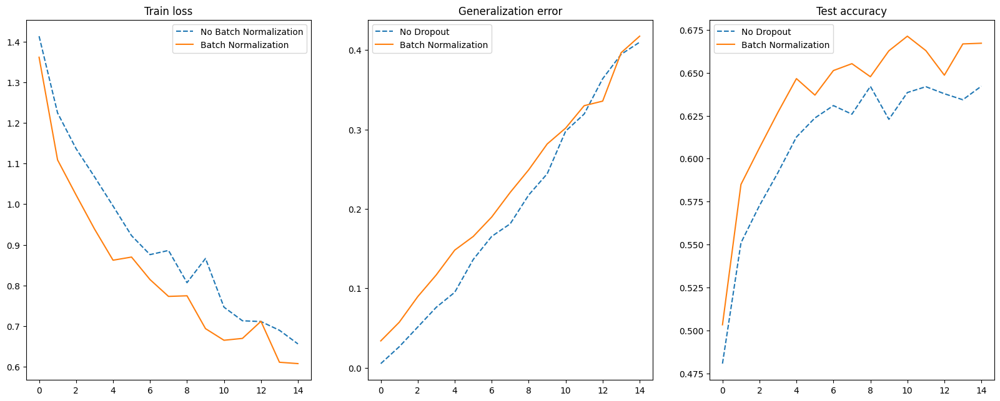

In [16]:
fig, ax=plt.subplots(1,3,figsize=(20,7.5))
ax[0].plot(train_loss_vanilla,label='No Batch Normalization',linestyle='--')
ax[0].plot(train_loss_batchnorm,label='Batch Normalization')
ax[0].set_title('Train loss')
ax[0].legend()
ax[1].plot(generalization_vanilla,label='No Dropout',linestyle='--')
ax[1].plot(np.abs(np.array(train_loss_batchnorm)-np.array(test_loss_batchnorm)),label='Batch Normalization')
ax[1].set_title('Generalization error')
ax[1].legend()
ax[2].plot(test_accuracy_vanilla,label='No Dropout',linestyle='--')
ax[2].plot(test_accuracy_batchnorm,label='Batch Normalization')
ax[2].set_title('Test accuracy')
ax[2].legend()

Based on the plot, we can observe that batch normalization helps the model to converge faster, but it doesn't completely prevent overfitting. The model with batch normalization still has a higher generalization error than the model without it. However, despite the overfitting, the model with batch normalization performs better in terms of accuracy on the test set compared to the model without batch normalization.

By combining batch normalization and dropout, we can achieve even better performance and avoid overfitting. Dropout helps to prevent overfitting by randomly dropping out some neurons during training, while batch normalization helps to normalize the input to each layer and reduce the internal covariate shift. Together, they provide a more robust and stable training process that results in better generalization performance.

In [17]:
#CNN with batch normalization and dropout
class full_CNN(nn.Module):
    def __init__(self):
        super(full_CNN,self).__init__()
        self.conv1=nn.Conv2d(3,6,5)
        self.bn1=nn.BatchNorm2d(6)
        self.conv2=nn.Conv2d(6,16,5)
        self.bn2=nn.BatchNorm2d(16)
        self.fc1=nn.Linear(16*5*5,120)
        self.fc2=nn.Linear(120,84)
        self.fc3=nn.Linear(84,10)
        self.pool=nn.MaxPool2d(2,stride=2)
        self.activation=nn.ReLU()
        self.dropout=nn.Dropout(0.3)                            
    def forward(self,x):
        x=self.pool(self.activation(self.bn1(self.conv1(x))))
        x=self.pool(self.activation(self.bn2(self.conv2(x))))
        x=nn.Flatten()(x)
        x=self.activation(self.dropout(self.fc1(x)))
        x=self.activation(self.dropout(self.fc2(x)))
        x=self.fc3(x)
        return x

In [18]:
learning_rate=0.001
batch_size=50
epochs=15
train_loader,test_loader,train_test=data_loader(batch_size,train_dataset,test_dataset)
model=full_CNN()
train_loss_full,test_loss_full,train_accuracy_full,test_accuracy_full=train_model(learning_rate,epochs,model,train_loader,test_loader,train_test)

Epoch:001|Train Loss:1.34279|Test Loss:1.35631|Train Accuracy:0.51420|Test Accuracy:0.50950
Epoch:002|Train Loss:1.20873|Test Loss:1.23726|Train Accuracy:0.57286|Test Accuracy:0.56130
Epoch:004|Train Loss:1.04843|Test Loss:1.11440|Train Accuracy:0.63408|Test Accuracy:0.60950
Epoch:006|Train Loss:0.99577|Test Loss:1.08810|Train Accuracy:0.65192|Test Accuracy:0.61720
Epoch:008|Train Loss:0.89504|Test Loss:1.00534|Train Accuracy:0.68610|Test Accuracy:0.64460
Epoch:010|Train Loss:0.88194|Test Loss:1.00697|Train Accuracy:0.68654|Test Accuracy:0.64120
Epoch:012|Train Loss:0.85694|Test Loss:1.01405|Train Accuracy:0.69600|Test Accuracy:0.64780
Epoch:014|Train Loss:0.81444|Test Loss:0.98046|Train Accuracy:0.71320|Test Accuracy:0.65470
Final results: Epoch:15|Train Loss:0.77298|Test Loss:0.96129|Train Accuracy:0.72982|Test Accuracy:0.66640


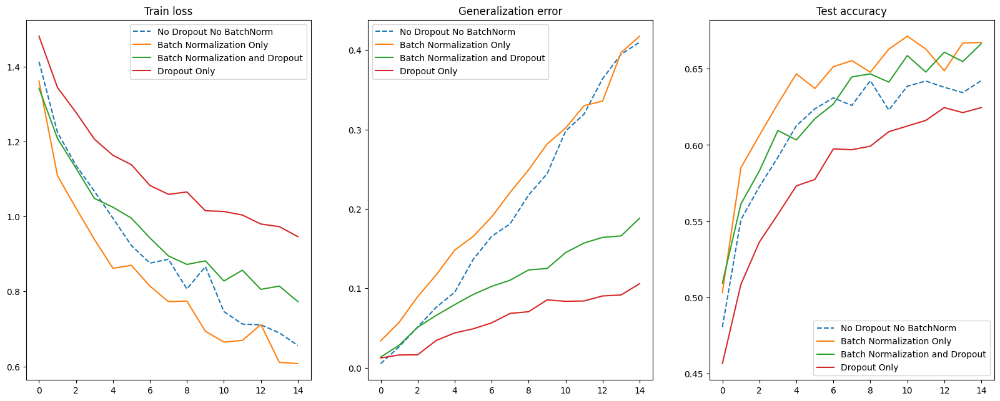

In [19]:
#Plotting the full CNN compared to vanilla CNN, batch normalization and dropout
fig, ax=plt.subplots(1,3,figsize=(20,7.5))
#Train loss
ax[0].plot(train_loss_vanilla,label='No Dropout No BatchNorm',linestyle='--')
ax[0].plot(train_loss_batchnorm,label='Batch Normalization Only')
ax[0].plot(train_loss_full,label='Batch Normalization and Dropout')
ax[0].plot(train_loss3,label='Dropout Only')
ax[0].set_title('Train loss')
ax[0].legend()
#Generalization error
ax[1].plot(generalization_vanilla,label='No Dropout No BatchNorm',linestyle='--')
ax[1].plot(np.abs(np.array(train_loss_batchnorm)-np.array(test_loss_batchnorm)),label='Batch Normalization Only')
ax[1].plot(np.abs(np.array(train_loss_full)-np.array(test_loss_full)),label='Batch Normalization and Dropout')
ax[1].plot(generalization3,label='Dropout Only')
ax[1].set_title('Generalization error')
ax[1].legend()
#Test accuracy
ax[2].plot(test_accuracy_vanilla,label='No Dropout No BatchNorm',linestyle='--')
ax[2].plot(test_accuracy_batchnorm,label='Batch Normalization Only')
ax[2].plot(test_accuracy_full,label='Batch Normalization and Dropout')
ax[2].plot(test_accuracy3,label='Dropout Only')
ax[2].set_title('Test accuracy')
ax[2].legend()

Based on the plot, it's evident that combining batch normalization and dropout leads to a significant reduction in generalization error compared to using batch normalization alone. Additionally, the model's accuracy on the test set is still high and comparable to the model with batch normalization only. This indicates that by using both batch normalization and dropout, we can achieve better generalization performance without sacrificing accuracy on the test set.

## Part 2 The DeepDream Method

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


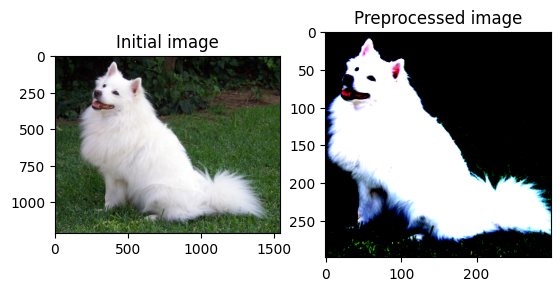

In [20]:
#Task 1 Load an image
url,filename=("https://github.com/pytorch/hub/raw/master/images/dog.jpg","dog.jpg")
try: urllib.URLopener().retrieve(url,filename)
except: urllib.request.urlretrieve(url,filename)
from PIL import Image
from torchvision import transforms
input_image=Image.open(filename)
preprocess=transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
])
input_tensor=preprocess(input_image)
input_batch=input_tensor.unsqueeze(0)
def deprocess(image):
    image=image.numpy().transpose(1,2,0)
    mean=[0.485,0.456,0.406]
    std=[0.229,0.224,0.225]
    image=std*image+mean
    image=np.clip(image,0,1)
    return image
#Print initial image
fig,ax=plt.subplots(1,2)
ax[0].imshow(input_image)
ax[0].set_title('Initial image')
ax[1].imshow(input_tensor.permute(1,2,0))
ax[1].set_title('Preprocessed image')
plt.show()

In [21]:
#Task 2 Load the pre-trained model and write code to allow for a 'hook'
model=torch.hub.load('pytorch/vision:v0.10.0','inception_v3',pretrained=True)
model.eval()
outputs=[]
def hook(module,input,output):
    outputs.append(output)

Using cache found in /home/kami/.cache/torch/hub/pytorch_vision_v0.10.0
/home/kami/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/kami/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [22]:
#Task 3 Create a hook
h=model.Conv2d_1a_3x3.register_forward_hook(hook)
h.remove()

The $\verb|register_forward_hook|$ method allows us to register a function that will be called after the forward pass of a layer in a PyTorch neural network. When a layer is called during a forward pass, the registered hook function is executed with the input and output tensors of the layer as arguments.

In the code provided, the $\verb|hook|$ function is defined to take the output tensor of a layer and store it in the global variable $\verb|outputs|$. By registering this hook function using $\verb|register_forward_hook\|$, we can access the output of any layer in the network during a forward pass.

The outputs list is used to store the output tensors of the layer across multiple forward passes. This can be useful for tasks such as feature visualization or interpretation. In this particular case, the outputs list is used to compute the L2 norm of the activation at a specific layer, which is used as a loss function for optimizing the image.

The outputs list is modified during each forward pass of the network, which means that it needs to be cleared before each pass to avoid accumulating outputs from previous passes. This can be done using outputs.clear() or by reinitializing outputs to an empty list before each forward pass.

In [23]:
#Task 4 Implement the DeepDream optimisation loop
def deepdream(iterations,learning_rate,start_image):
    start_image.requires_grad=True              #Allows the gradients to be calculated
    outputs.clear()                             #Clear the outputs list
    for _ in range(iterations):                 #Run the optimisation loop
        model(start_image)                      #Run the model
        loss=torch.norm(outputs[-1])            #Calculate the loss 
        loss.backward()                         #Calculate the gradients
        g=start_image.grad                      #Get the gradients
        g/=torch.abs(g).mean()                  #Normalize the gradients
        start_image=start_image+learning_rate*g #Update the image
        start_image.retain_grad()               #Retain the gradients
        model.zero_grad()                       #Reset the gradients
    return start_image                          #Return the final image

## InceptionV3 Architecture
Here is the list of all the layers that are used in the InceptionV3 Network.
\
$\verb|Conv2d_1a_3x3|$: 2D convolution layer
\
$\verb|Conv2d_2a_3x3|$: 2D convolution layer
\
$\verb|Conv2d_2b_3x3|$: 2D convolution layer
\
$\verb|Conv2d_3b_1x1|$: 2D convolution layer\
$\verb|Conv2d_4a_3x3|$: 2D convolution layer\
$\verb|Mixed_5b|$: Inception module\
$\verb|Mixed_5c|$: Inception module\
$\verb|Mixed_5d|$: Inception module\
$\verb|Mixed_6a|$: Inception module\
$\verb|Mixed_6b|$: Inception module\
$\verb|Mixed_6c|$: Inception module\
$\verb|Mixed_6d|$: Inception module\
$\verb|Mixed_6e|$: Inception module\
$\verb|Mixed_7a|$: Inception module\
$\verb|Mixed_7b|$: Inception module\
$\verb|Mixed_7c|$: Inception module\
$\verb|fc|$: Fully connected layer


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


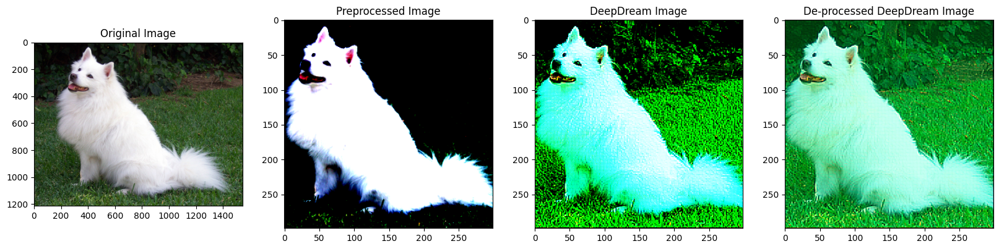

In [24]:
#Task 5 Present Comparisons of outputs 
#First convolutional Layer
iterations=10
learning_rate=0.1 
h=model.Conv2d_1a_3x3.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

When looking at the image produced by optimizing through the first convolutional layer, it can be seen that the contrast of the picture has been decreased and more details can be seen from the original image, in addition to that it seem like a green filter is applied to it. It does appear that the purpose of the first layer is to increase the clarity of the picture and it also picks up the most prevalent colour present in the picture.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


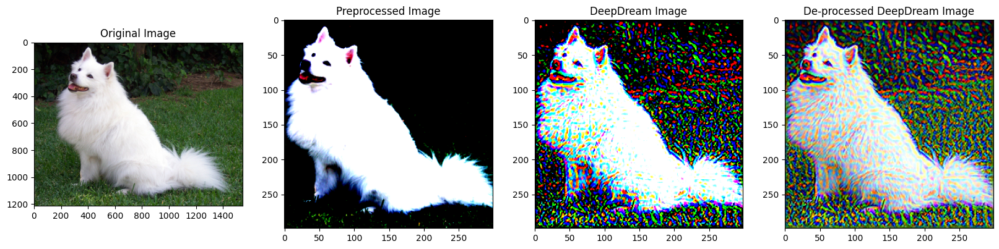

In [25]:
#Second convolutional Layer
iterations=10
learning_rate=0.1 
h=model.Conv2d_2a_3x3.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

The second convolutional layer does seem to perform similarly to the first layer but now it adds more of an RGB filter on the picture, it is now impossible to recognize what the original background looked like.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


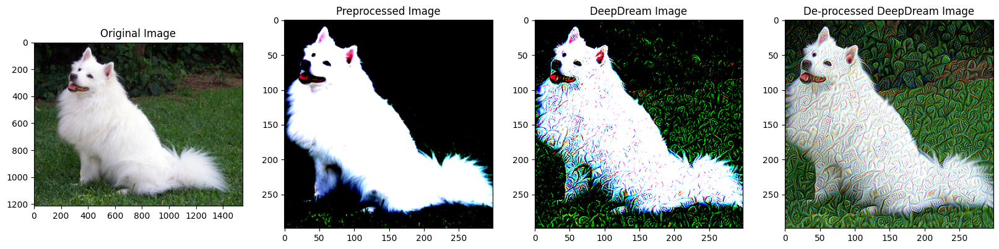

In [26]:
#First Inception Layer
iterations=10
learning_rate=0.1 
h=model.Mixed_5b.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


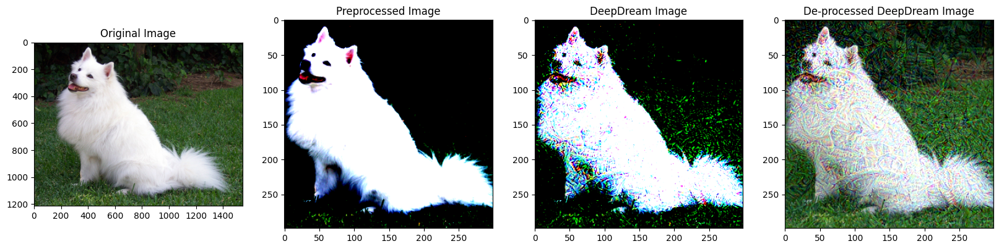

In [27]:
#Last Inception Layer
iterations=10
learning_rate=0.1
h=model.Mixed_7c.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

The deepdream optimization process relies heavily on the layer that is being optimized, and different layers produce vastly different effects on the original image. For example, when the last inception layer is optimized, the resulting image appears to have a psychedelic filter applied to the entire image. On the other hand, when the first inception layer is optimized, the effect is similar to adding a psychedelic filter, but it is applied to the whole image except for the face.

These differences in effects can be attributed to the different features that each layer is designed to detect. For instance, the first inception layer is typically focused on identifying basic shapes and features, while the last inception layer is responsible for identifying more complex patterns and structures. As such, when optimizing the last inception layer, the algorithm tends to focus on the more intricate features, resulting in a more chaotic, psychedelic effect.

In contrast, the first inception layer is primarily focused on identifying the face, resulting in the face being relatively untouched by the psychedelic filter. This effect is particularly evident in the eyes, nose, and mouth, which remain clear and recognizable despite the psychedelic filter applied to the rest of the image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


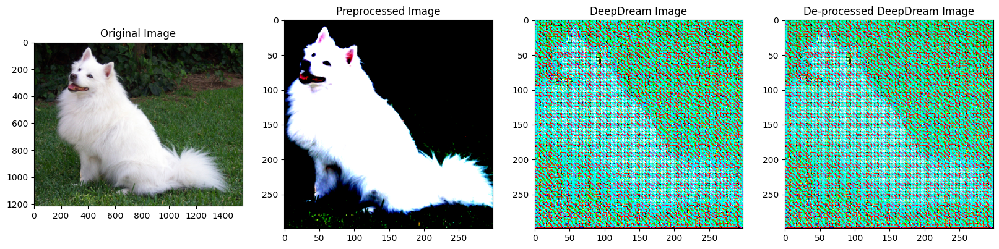

In [28]:
#First Convolutional Layer with 200 iterations
iterations=200
learning_rate=0.1 
h=model.Conv2d_1a_3x3.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


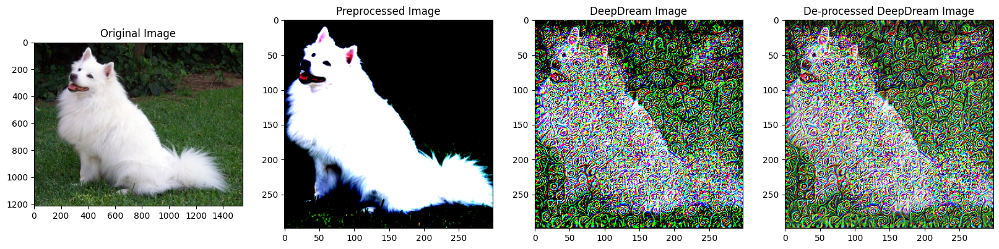

In [29]:
#First Inception Layer with 200 iterations
iterations=200
learning_rate=0.1
h=model.Mixed_5b.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


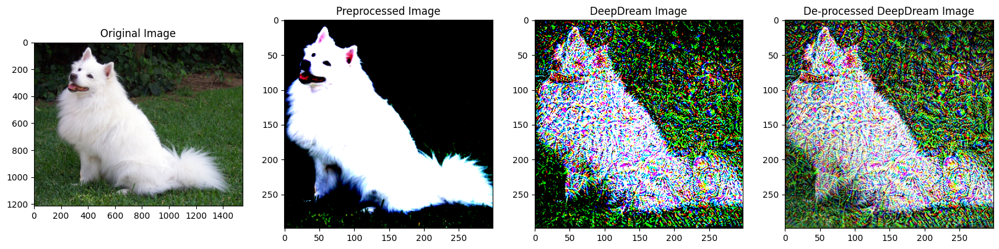

In [30]:
#Last Inception Layer with 200 iterations
iterations=200
learning_rate=0.1
h=model.Mixed_7c.register_forward_hook(hook)
image=deepdream(iterations,learning_rate,input_batch)
h.remove()
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

As the number of iterations increases, the image becomes more and more distorted. However, even with significant distortion, the original edges of the image can still be recognized. For instance, when iterating 200 times over the first convolutional layer, the picture appears mostly green and distorted, but the original edge of the dog, along with its eyes, nose, and ear, remain visible. This suggests that the first convolutional layer can identify the most critical features of the image. Similar results were observed in the other tested layers.

As expected, increasing the number of iterations leads to increased distortion because gradient ascent aims to create an image that differs as much as possible from the original one. However, the most intriguing behavior occurs when the first inception layer is iterated 200 times. The resulting image displays a psychedelic effect, yet the dog's facial features, such as the eyes, mouth, nose, and ear, remain readily identifiable and resemble those of the original image.

Overall, the deepdream optimization process demonstrates the power of neural networks to identify and highlight specific features of an image. By iteratively enhancing and exaggerating these features, the deepdream algorithm can produce fascinating and sometimes surreal visualizations that offer new insights into the inner workings of neural networks.

In [31]:
#Task 6 Improve the results by allowing to optimise for multiple layers
def deepdreams(iterations,learning_rate,start_image,layers):
    start_image.requires_grad=True                          #Allows the gradients to be calculated
    for _ in range(iterations):
        loss=0                                              #Reset the loss
        outputs.clear()
        for layer in layers:
            h=layer.register_forward_hook(hook)            #Register the hook
            model(start_image)                             #Run the model
            loss+=torch.norm(outputs[-1])                  #Calculate the loss
            h.remove()                                     #Remove the hook
        loss.backward()                                    #Calculate the gradients
        g=start_image.grad                                 #Get the gradients
        g/=torch.abs(g).mean()                             #Normalize the gradients
        start_image=start_image+learning_rate*g            #Update the image
        start_image.retain_grad()                          #Retain the gradients
        model.zero_grad()                                  #Reset the gradients
    return start_image                                     #Return the final image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


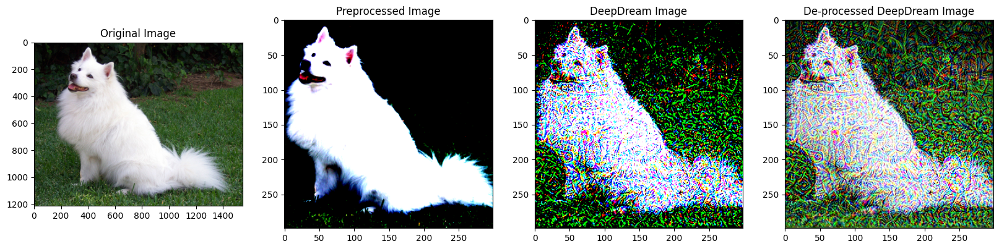

In [32]:
#Multiple layers optimization with 50 iterations
layers=[model.Conv2d_1a_3x3,model.Conv2d_2a_3x3,model.Mixed_5b,model.Mixed_7c]
iterations=50
learning_rate=0.1
image=deepdreams(iterations,learning_rate,input_batch,layers)
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


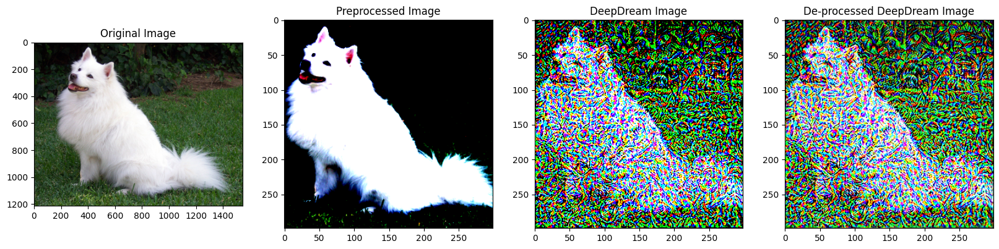

In [33]:
#Multiple layers optimization with 200 iterations
layers=[model.Conv2d_1a_3x3,model.Conv2d_2a_3x3,model.Mixed_5b,model.Mixed_7c]
iterations=200
learning_rate=0.1
image=deepdreams(iterations,learning_rate,input_batch,layers)
#Plot the results 
fig, ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(input_image)
ax[0].set_title('Original Image')
ax[1].imshow(input_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed Image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream Image')
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream Image')
plt.show()

By combining all of the layers analyzed previously we obtain an image with a very psychedelic filter and the mouth of the dog does not appear to be smiling as much but more of a grimace.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


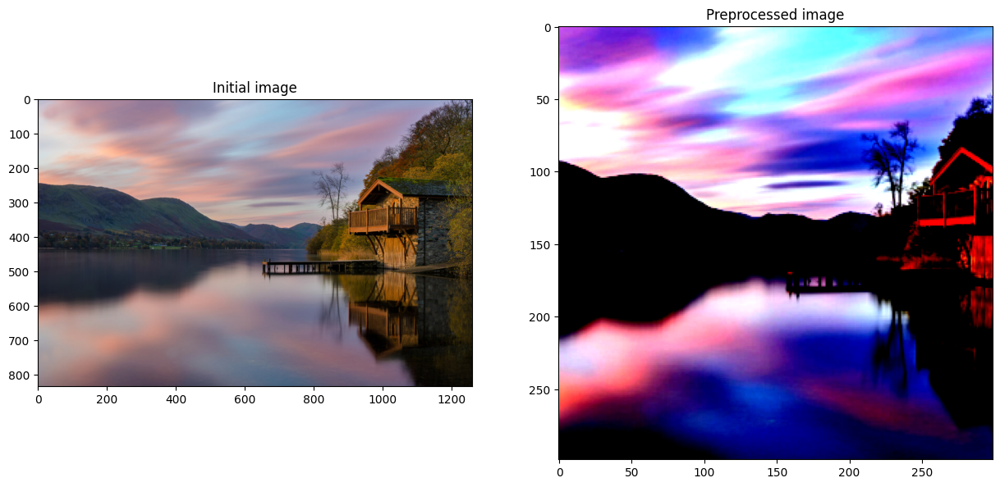

In [34]:
#Task 7 Own Dream
#Import the image lake.jpg
lake=Image.open('lake.jpg')
preprocess=transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],std=[0.229,0.224,0.225])
])
lake_tensor=preprocess(lake)
lake_batch=lake_tensor.unsqueeze(0)
#Print initial image
fig,ax=plt.subplots(1,2,figsize=(15,15))
ax[0].imshow(lake)
ax[0].set_title('Initial image')
ax[1].imshow(lake_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed image')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


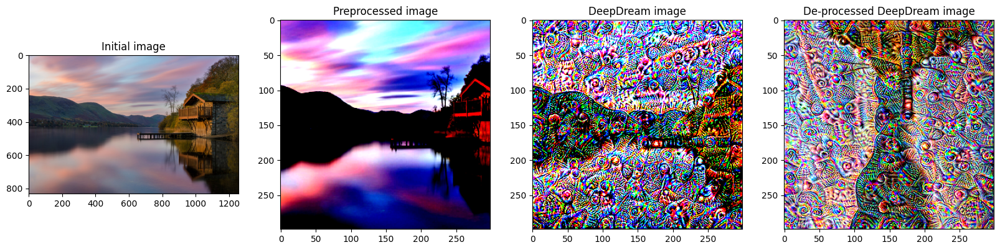

In [35]:
#DeepDreams 
layers=[model.Mixed_5b,model.Mixed_6a]
iterations=20
learning_rate=0.25
image=deepdreams(iterations,learning_rate,lake_batch,layers)
#Plot the results
fig,ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(lake)
ax[0].set_title('Initial image')
ax[1].imshow(lake_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream image')
#rotate the image by 90 degrees clockwise
image=torch.rot90(image,1,[2,3])
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('De-processed DeepDream image')
plt.show()

he lake image was selected due to its reflective surface, which creates a visual illusion that the upper and lower halves are identical. This characteristic presents an interesting challenge for a neural network, as it would struggle to differentiate between the reflection and the sky. By using gradient ascent, the resulting image will likely have very similar upper and lower halves. To enhance this effect, the image was rotated so that the reflection line runs vertically down the center.

To explore the capabilities of the neural network, the Mixed_5b and Mixed_6a layers were selected for analysis. These layers produce some of the most intriguing results, with features such as eyes and noses being prominently emphasized in the Mixed_6a layer. The selection of these layers allows for a deeper understanding of the neural network's ability to identify and emphasize specific features within an image.

The end result resembles a flower with many eyes and faces scattered throught the image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


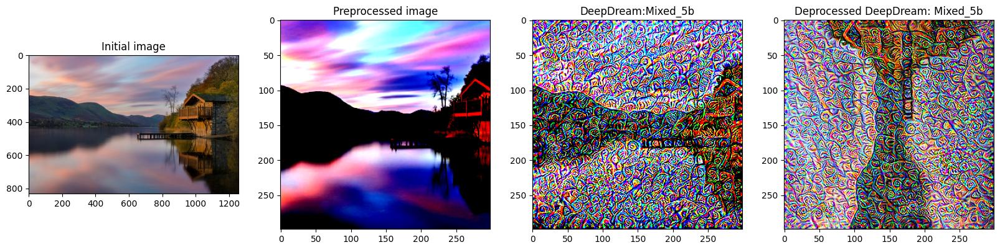

In [36]:
layers=[model.Mixed_5b]
iterations=20
learning_rate=0.25
image=deepdreams(iterations,learning_rate,lake_batch,layers)
#Plot the results
fig,ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(lake)
ax[0].set_title('Initial image')
ax[1].imshow(lake_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream:Mixed_5b')
#rotate the image by 90 degrees clockwise
image=torch.rot90(image,1,[2,3])
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('Deprocessed DeepDream: Mixed_5b')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


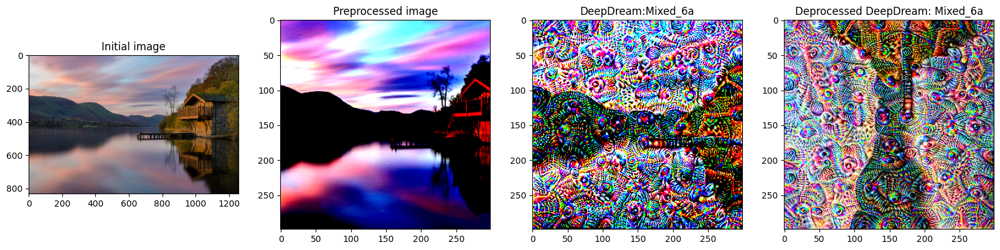

In [37]:
layers=[model.Mixed_6a]
iterations=20
learning_rate=0.25
image=deepdreams(iterations,learning_rate,lake_batch,layers)
#Plot the results
fig,ax=plt.subplots(1,4,figsize=(20,20))
ax[0].imshow(lake)
ax[0].set_title('Initial image')
ax[1].imshow(lake_batch[0].detach().numpy().transpose(1,2,0))
ax[1].set_title('Preprocessed image')
ax[2].imshow(image[0].detach().numpy().transpose(1,2,0))
ax[2].set_title('DeepDream:Mixed_6a')
#rotate the image by 90 degrees clockwise
image=torch.rot90(image,1,[2,3])
ax[3].imshow(deprocess(image[0].detach()))
ax[3].set_title('Deprocessed DeepDream: Mixed_6a')
plt.show()